In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.6/780.6 kB 3.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/ultralytics/runs/detect/predict4')

In [ ]:
# 드라이브 마운트
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!git clone http://github.com/ultralytics/ultralytics.git

Cloning into 'ultralytics'...
remote: Enumerating objects: 28426, done.
remote: Counting objects: 100% (142/142), done.
remote: Compressing objects: 100% (127/127), done.
remote: Total 28426 (delta 48), reused 65 (delta 15), pack-reused 28284
Receiving objects: 100% (28426/28426), 16.37 MiB | 20.85 MiB/s, done.
Resolving deltas: 100% (20057/20057), done.


In [ ]:
cd /content/drive/MyDrive/ultralytics/

/content/drive/MyDrive/ultralytics


In [ ]:
!pip install ultralytics

In [ ]:
import warnings
warnings.filterwarnings('ignore')

#필요한 라이브러리 삽입
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
import torch
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video


In [ ]:
# Seaborn은 matplotlib의 시각화툴의 격자는 어두운 색을 연보라색으로 지정
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

In [ ]:
# ultalytics의 pre-trained 모델 호출
model = YOLO('yolov8n.pt')

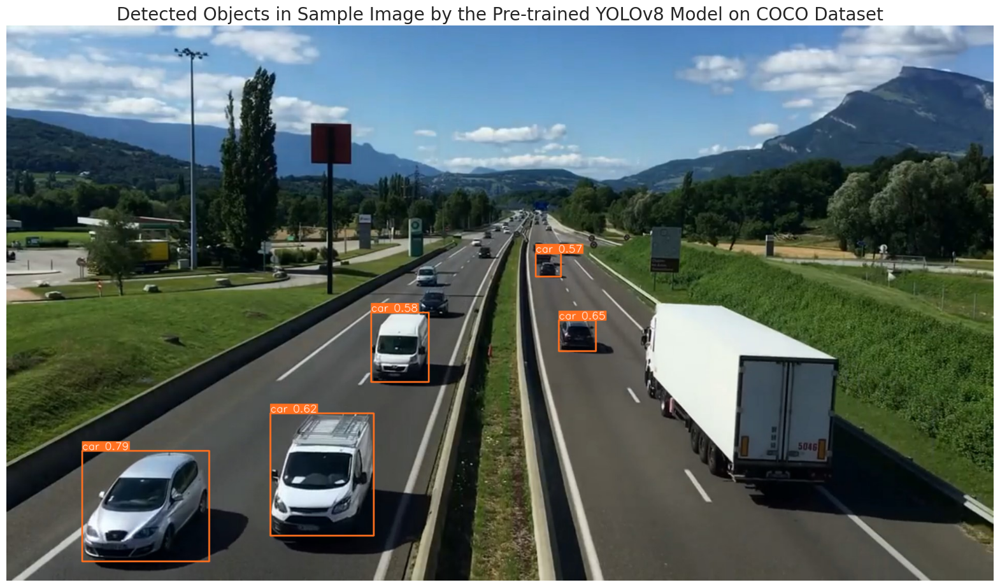

In [ ]:
#이미지 파일의 경로
image_path = '/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

#이미지 추론을 진행
results = model.predict(source=image_path,
                        imgsz=640,#이미지를 640x640으로 지정
                        verbose=False,#자세한 출력보단 요약정보만 출력
                        conf=0.5)   #객체감지 결과를 필터링할때 사용하는데 50%가 넘은 것만 결과에 포함하게 함

# 이미지에 result의 첫번째 결과를 넣고 이미지를 넘파일 배열로 변환하여 line_width를 통해 선의 넓이 결정
sample_image = results[0].plot(line_width=2)

# BGR을 plot시 정확한 결과 보기 위해 RGB로 변환
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

#image를 display
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on COCO Dataset', fontsize=20)
plt.axis('off')
plt.show()

In [ ]:
#데이터셋의 경로 지정
dataset_path = '/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset'

# data.yaml파일의 경로 지정 -> data.yaml은 데이터셋의 구성정보를 담고 있음
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# yaml파일을 로드하고 데이터 파일의 내용을 읽고 출력
with open(yaml_file_path, 'r') as file:
    yaml_content =yaml.load(file, Loader = yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



In [ ]:
# training과 validation 이미지들의 경로를 정해줌
trian_image_path = os.path.join(dataset_path, 'train', 'images')
validation_image_path = os.path.join(dataset_path, 'valid', 'images')

# train, vailid의 초기값 설정
num_trian_images = 0
num_valid_images = 0

# 이미지의 고유한 크기를 유지하도록 세트 초기화
train_image_size = set()
valid_image_size = set()

# train 이미지 크기 및 카운트 확인
for filename in os.listdir(trian_image_path):
    if filename.endswith('.jpg'):
        num_trian_images += 1
        image_path = os.path.join(trian_image_path, filename)
        with Image.open(image_path) as img:
            train_image_size.add(img.size)

# validation 이미지 크기 및 개수 확인
for filename in os.listdir(validation_image_path):
    if filename.endswith('.jpg'):
        num_valid_images +=1
        image_path = os.path.join(validation_image_path, filename)
        with Image.open(image_path) as img:
            valid_image_size.add(img.size)


# 결과 출력
print(f"Number of training images:, {num_trian_images}")
print(f"Number of validation images: {num_valid_images}")

# train 사이즈 모두 같은지 확인
if len(train_image_size) == 1:
    print(f"All training images have the same size: {train_image_size.pop()}")
else:
    print("Training images have verying sizes.")

# validation 사이즈 모두 같은지 확인
if len(valid_image_size) == 1:
    print(f"All validation images have the same size: {valid_image_size.pop()}")

else:
    print("Validation images have verying sizes")

Number of training images:, 1040
Number of validation images: 298
Training images have verying sizes.
Validation images have verying sizes


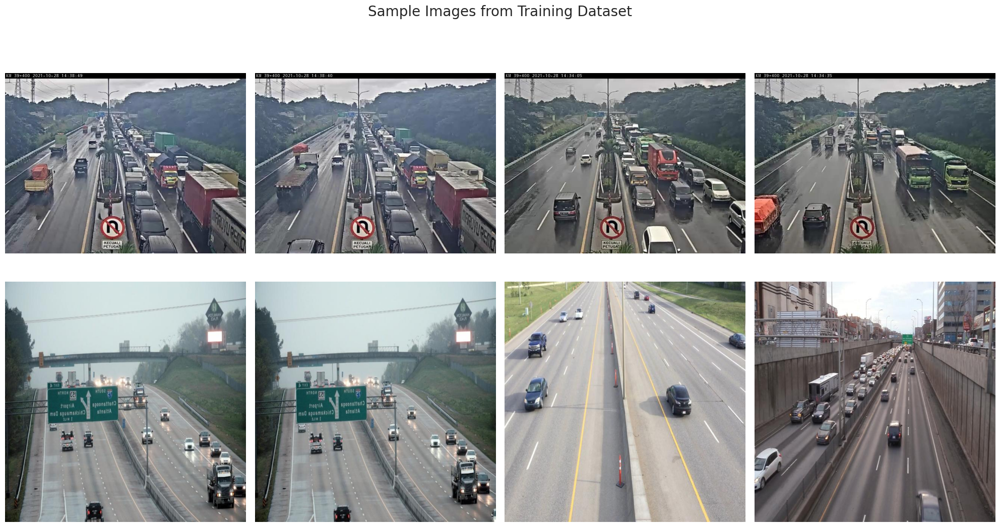

In [ ]:
#image path

image_files = [file for file in os.listdir(trian_image_path) if file.endswith('.jpg')]

# 8개의 영상을 동일한 간격으로 선택합니다
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

fig,axes = plt.subplots(2,4,figsize=(20,11))

#이미지 display
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path =os.path.join(trian_image_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset',fontsize=20)
plt.tight_layout()
plt.show()

In [ ]:
# dataset에 대한 Fine tunning
results = model.train(
    data = yaml_file_path,
    epochs = 50,
    imgsz=640,
    patience=50,
    batch = 32,
    optimizer = 'auto',
    lr0 = 0.01,
    lrf = 0.1,
    dropout=0.1,
    )

New https://pypi.org/project/ultralytics/8.2.30 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/data.yaml, epochs=50, time=None, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnost

train: Scanning /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/train/labels.cache... 1040 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1040/1040 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/train/images/adit_mp4-1357_jpg.rf.aa6810bcc08ae70f94e6c100a26b94fd.jpg: 2 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/valid/labels.cache... 298 images, 0 backgrounds, 0 corrupt: 100%|██████████| 298/298 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/ultralytics/runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/ultralytics/runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.94G      2.231      2.249       1.77        379        640: 100%|██████████| 33/33 [00:40<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all        298       4763      0.846     0.0481      0.116     0.0538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.73G       1.55      1.103       1.23        379        640: 100%|██████████| 33/33 [00:31<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.28s/it]


                   all        298       4763      0.831      0.599      0.701      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.57G      1.453     0.9741      1.172        388        640: 100%|██████████| 33/33 [00:30<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.10s/it]


                   all        298       4763      0.782      0.737      0.784      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.79G      1.421     0.9124      1.151        550        640: 100%|██████████| 33/33 [00:31<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all        298       4763      0.789      0.752      0.801      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       5.2G       1.39     0.8605       1.13        288        640: 100%|██████████| 33/33 [00:32<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.16s/it]

                   all        298       4763      0.772      0.758       0.79      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       5.5G      1.335     0.8282      1.112        310        640: 100%|██████████| 33/33 [00:28<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.76s/it]


                   all        298       4763      0.805      0.754      0.819      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.31G      1.337     0.8071      1.115        365        640: 100%|██████████| 33/33 [00:26<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]


                   all        298       4763      0.806      0.766       0.82      0.451

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.52G      1.314     0.7916      1.104        357        640: 100%|██████████| 33/33 [00:30<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.10it/s]

                   all        298       4763      0.801      0.771      0.837      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.16G      1.295     0.7585      1.095        513        640: 100%|██████████| 33/33 [00:31<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.78s/it]


                   all        298       4763      0.794      0.777       0.84       0.46

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.67G      1.313     0.7643      1.108        366        640: 100%|██████████| 33/33 [00:31<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all        298       4763      0.799      0.769      0.815      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.44G      1.269     0.7424      1.083        347        640: 100%|██████████| 33/33 [00:28<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.76s/it]

                   all        298       4763       0.75      0.751      0.793      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.45G       1.26     0.7187      1.081        329        640: 100%|██████████| 33/33 [00:27<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all        298       4763      0.782      0.773      0.824       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       5.2G      1.268     0.7179       1.09        319        640: 100%|██████████| 33/33 [00:31<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all        298       4763      0.796      0.763      0.831      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.71G      1.246     0.7007       1.07        385        640: 100%|██████████| 33/33 [00:30<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.45s/it]

                   all        298       4763      0.741      0.727       0.78      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.69G      1.246     0.7013      1.067        371        640: 100%|██████████| 33/33 [00:27<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.19s/it]

                   all        298       4763      0.783      0.723      0.804       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.16G      1.227     0.6879      1.069        299        640: 100%|██████████| 33/33 [00:27<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.00s/it]

                   all        298       4763      0.808       0.75      0.826      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.67G      1.224     0.6887      1.068        331        640: 100%|██████████| 33/33 [00:34<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.11it/s]

                   all        298       4763      0.789      0.765      0.817      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.61G      1.217     0.6679      1.063        345        640: 100%|██████████| 33/33 [00:29<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]

                   all        298       4763       0.76      0.634      0.748      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.84G      1.203     0.6628      1.051        378        640: 100%|██████████| 33/33 [00:28<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.40s/it]

                   all        298       4763      0.828      0.756      0.843      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.26G      1.197     0.6552       1.05        365        640: 100%|██████████| 33/33 [00:29<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all        298       4763      0.813      0.746      0.832      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.45G      1.174     0.6509      1.042        332        640: 100%|██████████| 33/33 [00:31<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.10it/s]

                   all        298       4763       0.82      0.778      0.845      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.32G       1.19      0.649      1.048        322        640: 100%|██████████| 33/33 [00:30<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.32s/it]

                   all        298       4763      0.769      0.733      0.819      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.91G        1.2     0.6503      1.053        381        640: 100%|██████████| 33/33 [00:27<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]

                   all        298       4763      0.727      0.623      0.718      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.04G      1.189     0.6507      1.051        322        640: 100%|██████████| 33/33 [00:32<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.35s/it]

                   all        298       4763      0.748      0.656      0.752       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.45G      1.188     0.6448      1.054        498        640: 100%|██████████| 33/33 [00:28<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.13it/s]

                   all        298       4763      0.774      0.703      0.793      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.33G      1.192     0.6361      1.052        325        640: 100%|██████████| 33/33 [00:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.12it/s]

                   all        298       4763      0.735      0.707      0.784      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.67G      1.174     0.6281      1.045        331        640: 100%|██████████| 33/33 [00:29<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]

                   all        298       4763       0.79      0.683      0.793      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.27G      1.169     0.6215      1.046        431        640: 100%|██████████| 33/33 [00:27<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all        298       4763      0.817      0.722      0.821      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.56G      1.163     0.6225      1.043        327        640: 100%|██████████| 33/33 [00:29<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.10it/s]

                   all        298       4763      0.785        0.7      0.807      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.06G      1.161     0.6212       1.04        319        640: 100%|██████████| 33/33 [00:31<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.17it/s]

                   all        298       4763      0.776      0.708       0.79      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.66G      1.165      0.618      1.043        260        640: 100%|██████████| 33/33 [00:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.28s/it]

                   all        298       4763      0.773      0.719      0.805      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.69G      1.137      0.602      1.029        330        640: 100%|██████████| 33/33 [00:28<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.51s/it]

                   all        298       4763      0.778       0.66      0.775      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.56G      1.139     0.6109      1.035        442        640: 100%|██████████| 33/33 [00:28<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.09s/it]

                   all        298       4763      0.799      0.725      0.822      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.22G      1.139     0.6044      1.036        214        640: 100%|██████████| 33/33 [00:30<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.09it/s]

                   all        298       4763      0.808      0.774      0.833      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.15G      1.137     0.5985       1.03        445        640: 100%|██████████| 33/33 [00:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.15it/s]

                   all        298       4763      0.774      0.699      0.802      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.55G      1.129     0.6019      1.031        338        640: 100%|██████████| 33/33 [00:30<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.29s/it]

                   all        298       4763      0.815      0.756      0.828      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       5.8G      1.124      0.598      1.021        341        640: 100%|██████████| 33/33 [00:29<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]

                   all        298       4763      0.808      0.758      0.834      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.62G      1.143     0.5987      1.033        257        640: 100%|██████████| 33/33 [00:30<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all        298       4763      0.779      0.684       0.79       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.72G      1.134     0.5925       1.03        332        640: 100%|██████████| 33/33 [00:31<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.09it/s]

                   all        298       4763      0.775       0.69      0.788      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.25G      1.109     0.5848      1.021        191        640: 100%|██████████| 33/33 [00:31<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.00s/it]

                   all        298       4763      0.775      0.634      0.764      0.467


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.95G      1.097     0.5609      1.023        189        640: 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.15it/s]

                   all        298       4763      0.795      0.712        0.8      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.41G      1.093      0.549      1.018        224        640: 100%|██████████| 33/33 [00:25<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]

                   all        298       4763      0.801      0.763      0.829      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       4.4G      1.079     0.5438      1.017        174        640: 100%|██████████| 33/33 [00:25<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.20it/s]

                   all        298       4763      0.762      0.697      0.793      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.44G      1.073     0.5371      1.014        238        640: 100%|██████████| 33/33 [00:29<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all        298       4763      0.784      0.735      0.814      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.44G      1.071     0.5371      1.017        195        640: 100%|██████████| 33/33 [00:31<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]

                   all        298       4763      0.764      0.705      0.794      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.45G      1.065     0.5334      1.013        236        640: 100%|██████████| 33/33 [00:26<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all        298       4763      0.818      0.747      0.829      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.41G      1.064       0.53      1.012        203        640: 100%|██████████| 33/33 [00:28<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.16it/s]

                   all        298       4763      0.787      0.713      0.809      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.42G      1.059     0.5272      1.007        220        640: 100%|██████████| 33/33 [00:28<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.30s/it]

                   all        298       4763      0.801      0.735       0.82      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.45G      1.048     0.5175      1.005        286        640: 100%|██████████| 33/33 [00:25<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.32s/it]

                   all        298       4763      0.791      0.701      0.799      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.43G      1.048     0.5206      1.003        182        640: 100%|██████████| 33/33 [00:27<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]

                   all        298       4763      0.757      0.673      0.768      0.469



50 epochs completed in 0.522 hours.
Optimizer stripped from /content/drive/MyDrive/ultralytics/runs/detect/train3/weights/last.pt, 6.3MB
Optimizer stripped from /content/drive/MyDrive/ultralytics/runs/detect/train3/weights/best.pt, 6.3MB

Validating /content/drive/MyDrive/ultralytics/runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:19<00:00,  3.96s/it]


                   all        298       4763      0.818      0.747      0.829      0.492
Speed: 0.3ms preprocess, 4.0ms inference, 0.1ms loss, 7.4ms postprocess per image
Results saved to /content/drive/MyDrive/ultralytics/runs/detect/train3


In [ ]:
# train 파일 경로 지정
post_training_files_path ='/content/drive/MyDrive/ultralytics/runs/detect/train2'


In [ ]:

best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

best_model = YOLO(best_model_path)

metrics = best_model.val(split='val')


Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 16.1MB/s]
val: Scanning /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/valid/labels.cache... 298 images, 0 backgrounds, 0 corrupt: 100%|██████████| 298/298 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:23<00:00,  1.24s/it]


                   all        298       4763      0.825       0.74      0.836      0.495
Speed: 3.5ms preprocess, 8.0ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to /content/drive/MyDrive/ultralytics/runs/detect/val13


In [ ]:
#손실값에 대한 학습 곡선
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

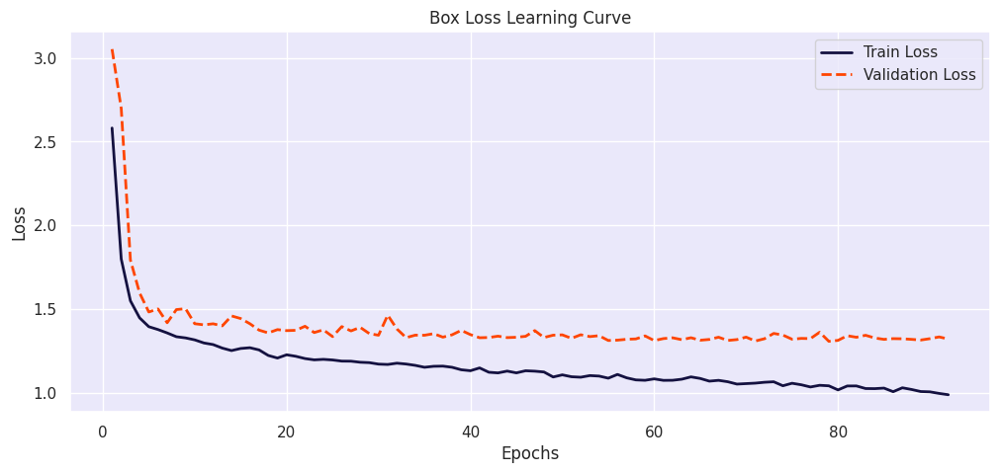

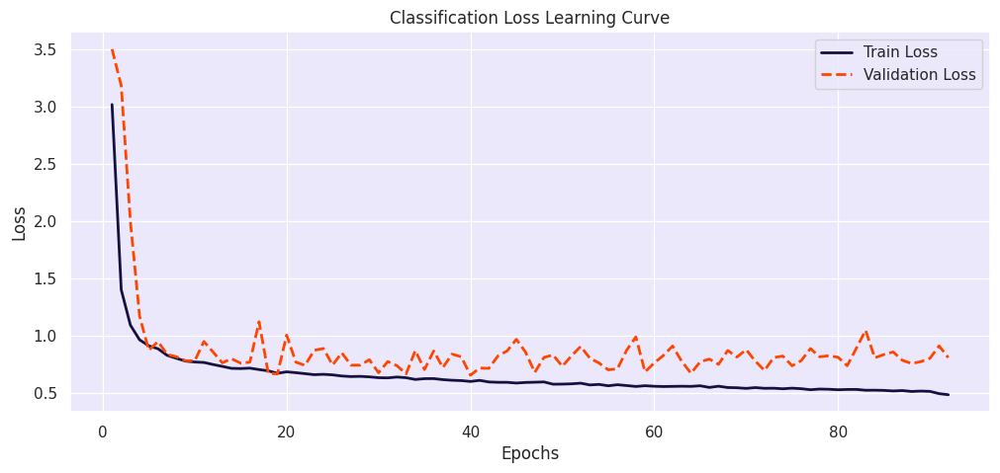

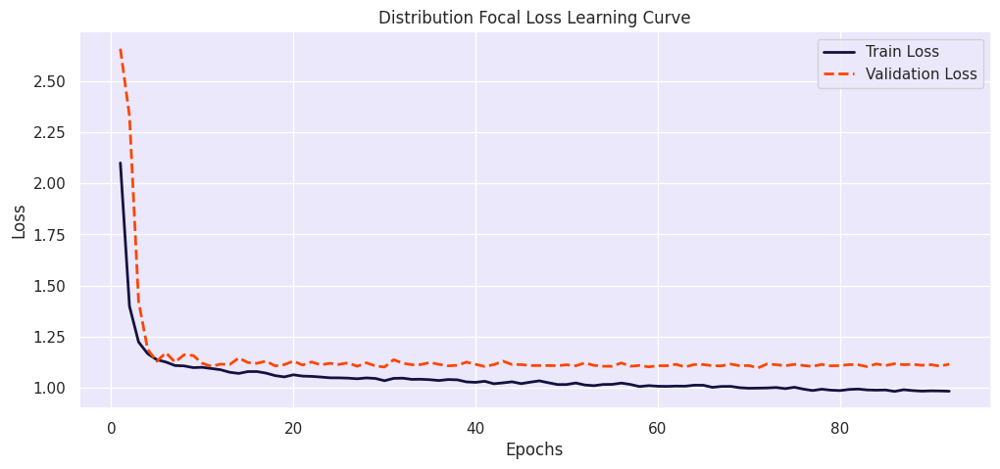

In [ ]:
#디렉토리와 파일 이름 사용하여 result.csv의 전체 파일 경로 생성
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# 구성한 csv파일을 panda Dataframe에 로드
df = pd.read_csv(results_csv_path)

# 공백제거
df.columns = df.columns.str.strip()

#손실에 대한 학습곡선 표시
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')


image 1/1 /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/valid/images/adit_mp4-1025_jpg.rf.02da1faf0949ddfffd2fc5dd8b8dcadd.jpg: 480x640 5 Vehicles, 142.8ms
Speed: 1.5ms preprocess, 142.8ms inference, 3.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/valid/images/adit_mp4-622_jpg.rf.7bdcc8a87ae0d53e4f8402d1b4418848.jpg: 480x640 8 Vehicles, 10.4ms
Speed: 2.1ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/valid/images/adit_mp4-821_jpg.rf.3d8816971e617aea37d5ef72877513c8.jpg: 480x640 1 Vehicle, 8.0ms
Speed: 1.9ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_I

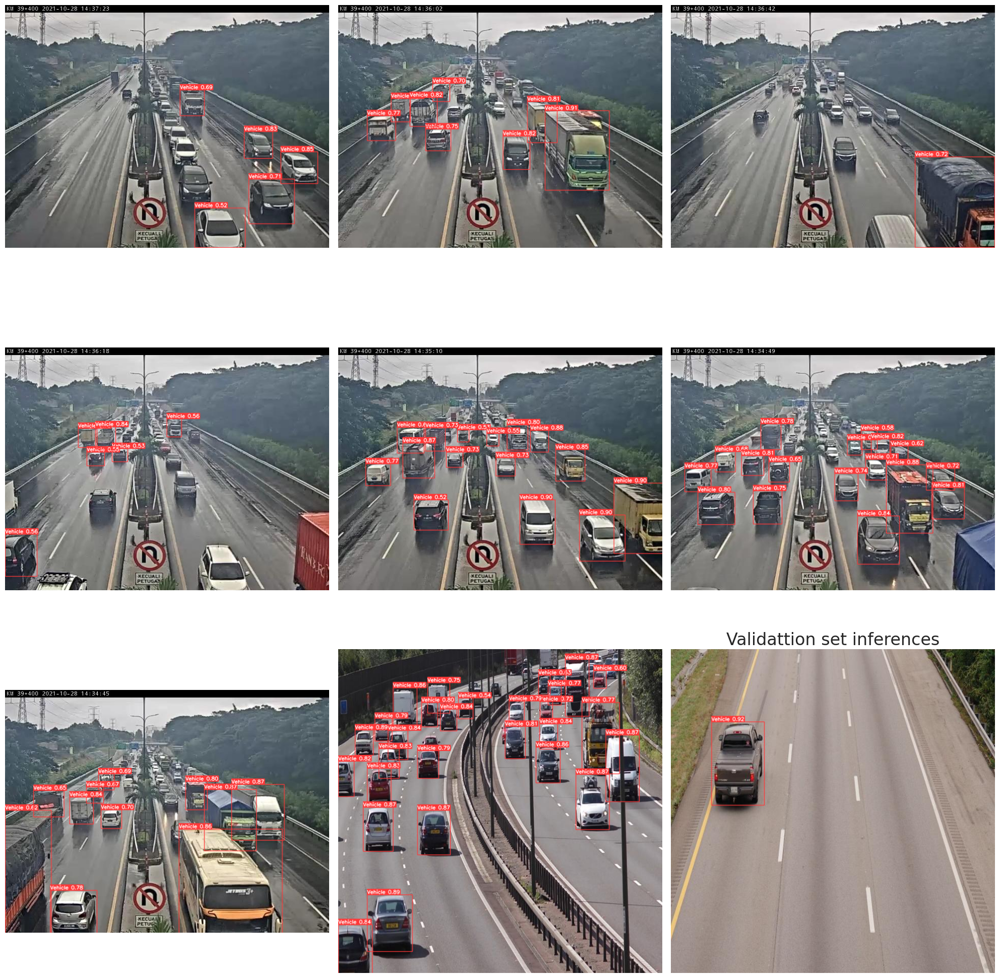

In [ ]:
# 유효성검사
valid_image_path = os.path.join(dataset_path, 'valid','images')

#디렉토리내 모든 JPG 나열
image_files = [file for file in os.listdir(valid_image_path) if file.endswith('.jpg')]

#동일한 간격으로 9장 영상 선택
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initailize the subplot
fig, axes = plt.subplots(3,3,figsize=(20,21))
plt.title('Validattion set inferences', fontsize=24)


#선택한 이미지에대한 enumerate 실행하고 표시
for i, ax, in enumerate(axes.flatten()):
    image_path = os.path.join(valid_image_path, selected_images[i])
    results = best_model.predict(source = image_path, imgsz = 640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb =cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()


image 1/1 /content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 4 Vehicles, 33.2ms
Speed: 3.3ms preprocess, 33.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


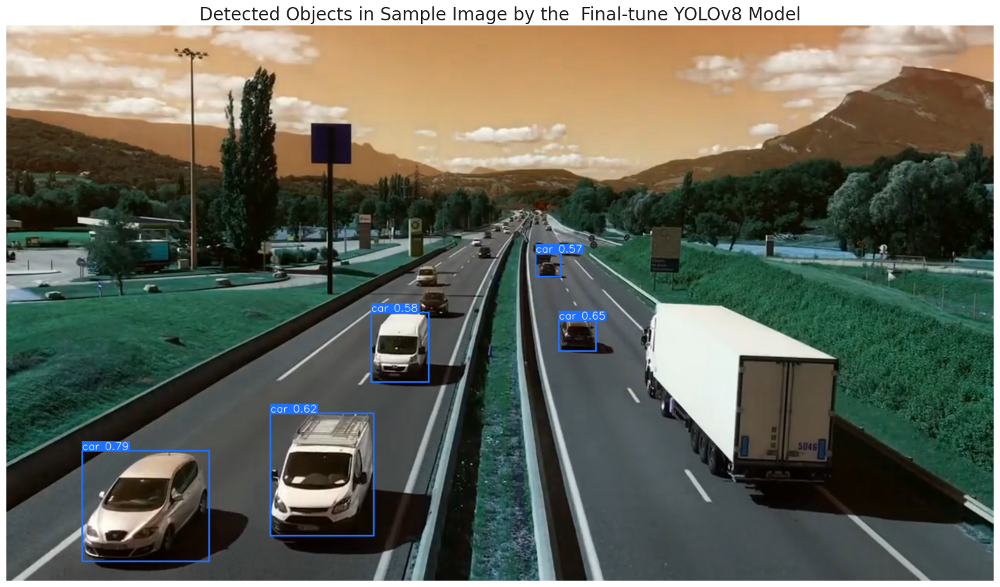

In [ ]:
sample_image_path = '/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

#best.pt 모델을 사용하여 제공된 이미지에 대한 추론 수행
results = best_model.predict(source=sample_image_path, imgsz=640,conf=0.7)

# 이미지를 numpy 배열로 변환합니다
smaple_image = results[0].plot(line_width=2)

#BGR에서 RGB로 변환합니다
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the  Final-tune YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

In [ ]:
# 데이터셋에서 비디오 경로 정의
dataset_video_path = '/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/sample_video.mp4'

# 비디오 경로 지정
video_path = '/content/drive/MyDrive/ultralytics/working/sample_video4.mp4'

# 비디오 경로 복사 및 처리
shutil.copyfile(dataset_video_path, video_path)

# 비디오 샘플 이용하여 최고의 성능 발휘하는 모델 이용하여 결과저장
best_model.predict(source=video_path, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) /content/drive/MyDrive/ultralytics/working/sample_video4.mp4: 384x640 3 Vehicles, 6.9ms
video 1/1 (frame 2/601) /content/drive/MyDrive/ultralytics/working/sample_video4.mp4: 384x640 3 Vehicles, 6.7ms
video 1/1 (frame 3/601) /content/drive/MyDrive/ultralytics/working/sample_video4.mp4: 384x640 3 Vehicles, 6.7ms
video 1/1 (frame 4/601) /content/drive/MyDrive/ultralytics/working/sample_video4.mp4: 384x640 3 Vehicles, 6.4ms
video 1/

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Vehicle'}
 obb: None
 orig_img: array([[[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[254, 246, 241],
         [254, 246, 241],
         [254, 246, 241],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        ...,
 
        [[ 94, 104, 103],
         [ 96, 106, 105],
         [101, 111, 110],
         ...,
         [ 94, 106, 111],
         [ 95, 107, 112],
         [ 97, 109, 114]],
 
        [[ 98, 108, 107],
         [103, 113, 112],
         [100, 110, 109],
         ...,
         [ 95, 10

In [ ]:
# 데이터셋에서 비디오 경로 정의
dataset_video_path = '/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/presentation_sample.mp4'

# 비디오 경로 지정
video_path = '/content/drive/MyDrive/ultralytics/working/check_Yolo.mp4'

# 비디오 경로 복사 및 처리
shutil.copyfile(dataset_video_path, video_path)

# 비디오 샘플 이용하여 최고의 성능 발휘하는 모델 이용하여 결과저장
best_model.predict(source=video_path, save=True)

In [ ]:

# 교통을 '중'으로 간주하는 임계값 정의
heavy_traffic_threshold = 8

vertices = np.array([
    (465, 350),  # vertices의 좌측 상단
    (2, 630),    # vertices의 우측 상단
    (1203, 630),   # vertices의 우측 하단
    (815, 350),    # vertices의 좌측 하단
], dtype=np.int32)

x1,x2 = 325,635
lane_threshold = 609
background_color = (255, 255, 255)

# 이미지에 텍스트 주석을 넣을 위치 정의
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)


# 폰트, 스케일 및 주석 색상 정의
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (0, 0, 0)    # 흰색 텍스트

#viedo 가져옴
cap = cv2.VideoCapture('/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/sample_video.mp4')
# 비디오 작성 객체 설정
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/drive/MyDrive/Top-View Vehicle Detection Image Dataset/Vehicle_Detection_Image_Dataset/traffic_density_analysis.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))
while cap.isOpened():
    # 프레임 가져오기
    ret, frame = cap.read()
    if ret:
        # 원본 프레임 복사하여 수정
        detection_frame = frame.copy()

        # 지정된 수직 범위를 벗어난 영역을 차단
        detection_frame[:x1, :] = 0
        detection_frame[x2:, :] = 0

        # 프레임에서 추론 수행 (여기서는 가상의 모델 사용)
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)

        # 프레임의 상단 및 하단 부분을 복원
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()

        # 사각형 그리기
        cv2.polylines(processed_frame, [vertices], isClosed=True, color=(0, 255, 0), thickness=2)

        # 결과에서 바운딩 박스 가져오기
        bounding_boxes = results[0].boxes

        # 정해진 영역 내의 차량 수 초기화
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0

        # 각 바운딩 박스를 확인하여 정해진 영역 내의 차량 수 계산
        for box in bounding_boxes.xyxy:
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1


        # 교통 혼잡도 결정
        if vehicles_in_left_lane > heavy_traffic_threshold:
            traffic_left_intensity = "high"
        elif vehicles_in_left_lane == heavy_traffic_threshold:
            traffic_left_intensity = "middle"
        else:
            traffic_left_intensity = "low"

        if vehicles_in_right_lane > heavy_traffic_threshold:
            traffic_right_intensity = "high"
        elif vehicles_in_right_lane == heavy_traffic_threshold:
            traffic_right_intensity = "middle"
        else:
            traffic_right_intensity = "low"


        # 배경박스 추가 (차량 수 텍스트)
        cv2.rectangle(processed_frame, (text_position_left_lane[0] - 10, text_position_left_lane[1] - 25),
              (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)
        # 사각형 위에 차량 수 텍스트 추가
        cv2.putText(processed_frame, f'Left_lane_Vehicle Count: {vehicles_in_left_lane}', text_position_left_lane,
            font, font_scale, font_color, 2, cv2.LINE_AA)

        # 배경박스 추가 (교통 혼잡도 텍스트)
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0] - 10, intensity_position_left_lane[1] - 25),
              (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)
        # 사각형 위에 교통 혼잡도 텍스트 추가
        cv2.putText(processed_frame, f'Traffic Congestion: {traffic_left_intensity}', intensity_position_left_lane,
            font, font_scale, font_color, 2, cv2.LINE_AA)

        # 배경박스 추가 (차량 수 텍스트)
        cv2.rectangle(processed_frame, (text_position_right_lane[0] - 10, text_position_right_lane[1] - 25),
              (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)
        # 사각형 위에 차량 수 텍스트 추가
        cv2.putText(processed_frame, f'Right_lane_Vehicle Count: {vehicles_in_right_lane}', text_position_right_lane,
            font, font_scale, font_color, 2, cv2.LINE_AA)

        # 배경박스 추가 (교통 혼잡도 텍스트)
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0] - 10, intensity_position_right_lane[1] - 25),
              (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)
        # 사각형 위에 교통 혼잡도 텍스트 추가
        cv2.putText(processed_frame, f'Traffic Congestion: {traffic_right_intensity}', intensity_position_right_lane,
            font, font_scale, font_color, 2, cv2.LINE_AA)

        # 처리된 프레임을 출력 비디오에 작성
        out.write(processed_frame)
    else:
        break

# 비디오 캡처 및 비디오 작성 객체 해제
cap.release()
out.release()




0: 384x640 (no detections), 22.6ms
Speed: 2.2ms preprocess, 22.6ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 12.2ms
Speed: 1.9ms preprocess, 12.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 26.8ms
Speed: 6.4ms preprocess, 26.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 10.2ms
Speed: 1.9ms preprocess, 10.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 30.5ms
Speed: 1.8ms preprocess, 30.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.5ms
Speed: 1.9ms preprocess, 9.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 15.2ms
Speed: 2.5ms preprocess, 15.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 10.3ms
Speed: 1.8ms preprocess, 10.3ms in

In [ ]:
!cat /proc/uptime | awk '{printf("잔여시간 : %.2f", 12-$1/60/60)}'

잔여시간 : 11.95